In [ ]:
import zipfile

with zipfile.ZipFile("/content/archive (3).zip", "r") as zip_ref:
    zip_ref.extractall("/content/archive")

In [ ]:
import os

DATA_DIR = './archive'
print(os.listdir(DATA_DIR))

['clouds']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 128
batch_size = 32
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=25):
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=5).permute(1, 2, 0))

def show_batch(dl, nmax=25):
    for images, _ in dl:
        show_images(images, nmax)
        break

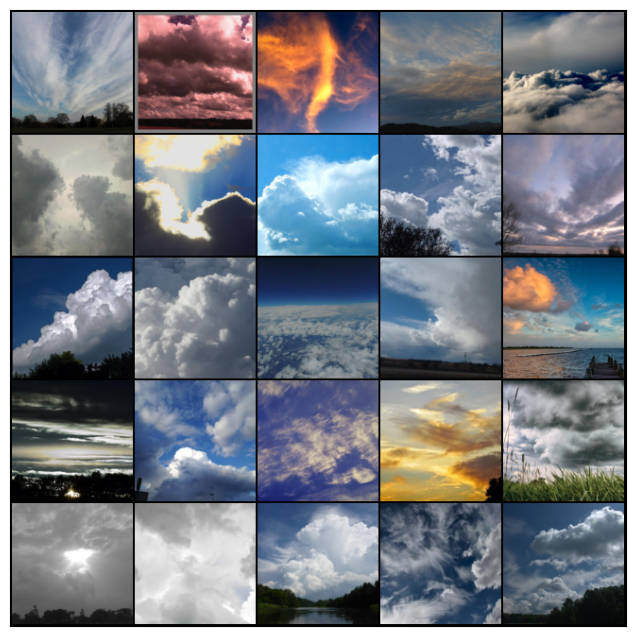

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 256

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(1024),
    nn.ReLU(True),
    # out: 1024 x 4 x 4

    nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 8 x 8

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 32 x 32

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([32, 3, 128, 128])


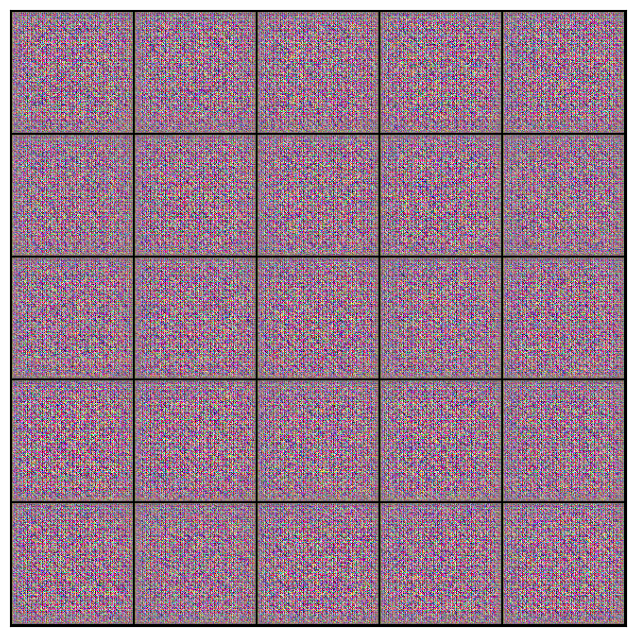

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=5)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=5).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(30, latent_size, 1, 1, device=device)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 200

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [1/200], loss_g: 9.0688, loss_d: 1.2305, real_score: 0.8994, fake_score: 0.6604
Saving generated-images-0001.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [2/200], loss_g: 4.5591, loss_d: 0.0563, real_score: 0.9808, fake_score: 0.0357
Saving generated-images-0002.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [3/200], loss_g: 4.7960, loss_d: 0.0278, real_score: 0.9910, fake_score: 0.0185
Saving generated-images-0003.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [4/200], loss_g: 5.4656, loss_d: 0.0253, real_score: 0.9904, fake_score: 0.0153
Saving generated-images-0004.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [5/200], loss_g: 8.2258, loss_d: 0.0754, real_score: 0.9785, fake_score: 0.0500
Saving generated-images-0005.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [6/200], loss_g: 5.4109, loss_d: 0.0396, real_score: 0.9922, fake_score: 0.0306
Saving generated-images-0006.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [7/200], loss_g: 6.3409, loss_d: 0.0541, real_score: 0.9546, fake_score: 0.0042
Saving generated-images-0007.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [8/200], loss_g: 8.7682, loss_d: 0.0134, real_score: 0.9871, fake_score: 0.0003
Saving generated-images-0008.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [9/200], loss_g: 5.8622, loss_d: 0.0132, real_score: 0.9975, fake_score: 0.0106
Saving generated-images-0009.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [10/200], loss_g: 5.6782, loss_d: 0.0130, real_score: 0.9979, fake_score: 0.0108
Saving generated-images-0010.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [11/200], loss_g: 11.2413, loss_d: 0.0016, real_score: 0.9985, fake_score: 0.0001
Saving generated-images-0011.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [12/200], loss_g: 11.6855, loss_d: 7.1498, real_score: 0.9934, fake_score: 0.9990
Saving generated-images-0012.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [13/200], loss_g: 3.3343, loss_d: 0.5195, real_score: 0.8673, fake_score: 0.2824
Saving generated-images-0013.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [14/200], loss_g: 3.9949, loss_d: 1.0267, real_score: 0.6514, fake_score: 0.3335
Saving generated-images-0014.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [15/200], loss_g: 1.4583, loss_d: 5.3163, real_score: 0.0100, fake_score: 0.0028
Saving generated-images-0015.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [16/200], loss_g: 3.0361, loss_d: 0.9566, real_score: 0.4620, fake_score: 0.0302
Saving generated-images-0016.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [17/200], loss_g: 3.3879, loss_d: 0.5902, real_score: 0.5993, fake_score: 0.0427
Saving generated-images-0017.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [18/200], loss_g: 3.2750, loss_d: 0.3486, real_score: 0.8951, fake_score: 0.1946
Saving generated-images-0018.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [19/200], loss_g: 0.7788, loss_d: 0.7238, real_score: 0.6035, fake_score: 0.1247
Saving generated-images-0019.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [20/200], loss_g: 2.9975, loss_d: 0.2955, real_score: 0.9052, fake_score: 0.1613
Saving generated-images-0020.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [21/200], loss_g: 4.9456, loss_d: 0.6035, real_score: 0.9376, fake_score: 0.3922
Saving generated-images-0021.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [22/200], loss_g: 3.5395, loss_d: 0.7733, real_score: 0.7329, fake_score: 0.2799
Saving generated-images-0022.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [23/200], loss_g: 4.2241, loss_d: 1.0001, real_score: 0.8339, fake_score: 0.5151
Saving generated-images-0023.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [24/200], loss_g: 0.9165, loss_d: 2.6056, real_score: 0.1628, fake_score: 0.0791
Saving generated-images-0024.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [25/200], loss_g: 1.1565, loss_d: 0.7558, real_score: 0.5423, fake_score: 0.0762
Saving generated-images-0025.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [26/200], loss_g: 3.1637, loss_d: 0.6119, real_score: 0.7504, fake_score: 0.2462
Saving generated-images-0026.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [27/200], loss_g: 1.3221, loss_d: 0.4335, real_score: 0.8020, fake_score: 0.1680
Saving generated-images-0027.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [28/200], loss_g: 1.5593, loss_d: 2.0916, real_score: 0.1739, fake_score: 0.0078
Saving generated-images-0028.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [29/200], loss_g: 2.1011, loss_d: 0.6804, real_score: 0.6552, fake_score: 0.1317
Saving generated-images-0029.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [30/200], loss_g: 4.6399, loss_d: 0.5646, real_score: 0.9741, fake_score: 0.3845
Saving generated-images-0030.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [31/200], loss_g: 2.2312, loss_d: 0.8357, real_score: 0.6058, fake_score: 0.2212
Saving generated-images-0031.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [32/200], loss_g: 3.3946, loss_d: 0.7703, real_score: 0.8940, fake_score: 0.4367
Saving generated-images-0032.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [33/200], loss_g: 3.6581, loss_d: 0.4112, real_score: 0.7686, fake_score: 0.1153
Saving generated-images-0033.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [34/200], loss_g: 4.4999, loss_d: 1.1310, real_score: 0.8095, fake_score: 0.5364
Saving generated-images-0034.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [35/200], loss_g: 3.8595, loss_d: 0.7730, real_score: 0.9329, fake_score: 0.4326
Saving generated-images-0035.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [36/200], loss_g: 1.8451, loss_d: 0.9861, real_score: 0.4898, fake_score: 0.1010
Saving generated-images-0036.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [37/200], loss_g: 9.3449, loss_d: 1.2133, real_score: 0.9248, fake_score: 0.6150
Saving generated-images-0037.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [38/200], loss_g: 2.1414, loss_d: 1.5938, real_score: 0.2785, fake_score: 0.0261
Saving generated-images-0038.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [39/200], loss_g: 3.3848, loss_d: 0.9922, real_score: 0.7305, fake_score: 0.4039
Saving generated-images-0039.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [40/200], loss_g: 4.3924, loss_d: 0.1195, real_score: 0.9248, fake_score: 0.0369
Saving generated-images-0040.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [41/200], loss_g: 2.6318, loss_d: 1.5459, real_score: 0.3272, fake_score: 0.0256
Saving generated-images-0041.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [42/200], loss_g: 4.3921, loss_d: 0.1874, real_score: 0.8743, fake_score: 0.0451
Saving generated-images-0042.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [43/200], loss_g: 5.6384, loss_d: 0.1753, real_score: 0.8552, fake_score: 0.0071
Saving generated-images-0043.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [44/200], loss_g: 3.3600, loss_d: 0.3018, real_score: 0.7685, fake_score: 0.0137
Saving generated-images-0044.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [45/200], loss_g: 7.3092, loss_d: 0.7350, real_score: 0.5198, fake_score: 0.0011
Saving generated-images-0045.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [46/200], loss_g: 4.6905, loss_d: 0.2008, real_score: 0.8968, fake_score: 0.0772
Saving generated-images-0046.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [47/200], loss_g: 4.7735, loss_d: 0.2586, real_score: 0.9960, fake_score: 0.2101
Saving generated-images-0047.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [48/200], loss_g: 3.2134, loss_d: 0.2004, real_score: 0.9155, fake_score: 0.0914
Saving generated-images-0048.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [49/200], loss_g: 4.2915, loss_d: 0.5305, real_score: 0.9767, fake_score: 0.3405
Saving generated-images-0049.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [50/200], loss_g: 5.3309, loss_d: 0.3749, real_score: 0.7269, fake_score: 0.0054
Saving generated-images-0050.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [51/200], loss_g: 7.9512, loss_d: 1.4412, real_score: 0.8707, fake_score: 0.6388
Saving generated-images-0051.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [52/200], loss_g: 4.7047, loss_d: 0.0959, real_score: 0.9262, fake_score: 0.0165
Saving generated-images-0052.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [53/200], loss_g: 6.8494, loss_d: 0.3621, real_score: 0.7256, fake_score: 0.0118
Saving generated-images-0053.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [54/200], loss_g: 6.0309, loss_d: 0.5660, real_score: 0.9003, fake_score: 0.3444
Saving generated-images-0054.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [55/200], loss_g: 4.1203, loss_d: 0.2270, real_score: 0.8123, fake_score: 0.0051
Saving generated-images-0055.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [56/200], loss_g: 4.2378, loss_d: 0.3082, real_score: 0.9961, fake_score: 0.2390
Saving generated-images-0056.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [57/200], loss_g: 5.7627, loss_d: 0.3114, real_score: 0.9516, fake_score: 0.2084
Saving generated-images-0057.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [58/200], loss_g: 3.1612, loss_d: 0.0635, real_score: 0.9903, fake_score: 0.0499
Saving generated-images-0058.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [59/200], loss_g: 2.8915, loss_d: 0.0522, real_score: 0.9904, fake_score: 0.0403
Saving generated-images-0059.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [60/200], loss_g: 4.1994, loss_d: 0.1710, real_score: 0.9081, fake_score: 0.0664
Saving generated-images-0060.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [61/200], loss_g: 7.2933, loss_d: 1.7758, real_score: 0.9802, fake_score: 0.7610
Saving generated-images-0061.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [62/200], loss_g: 4.9504, loss_d: 0.1208, real_score: 0.9848, fake_score: 0.0960
Saving generated-images-0062.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [63/200], loss_g: 5.6151, loss_d: 0.0735, real_score: 0.9348, fake_score: 0.0035
Saving generated-images-0063.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [64/200], loss_g: 7.7575, loss_d: 0.2774, real_score: 0.7795, fake_score: 0.0007
Saving generated-images-0064.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [65/200], loss_g: 3.2175, loss_d: 0.0626, real_score: 0.9927, fake_score: 0.0528
Saving generated-images-0065.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [66/200], loss_g: 3.9368, loss_d: 0.1597, real_score: 0.9587, fake_score: 0.0994
Saving generated-images-0066.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [67/200], loss_g: 3.8290, loss_d: 0.0933, real_score: 0.9826, fake_score: 0.0703
Saving generated-images-0067.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [68/200], loss_g: 5.1740, loss_d: 0.0268, real_score: 0.9887, fake_score: 0.0151
Saving generated-images-0068.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [69/200], loss_g: 6.5405, loss_d: 0.2594, real_score: 0.7976, fake_score: 0.0093
Saving generated-images-0069.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [70/200], loss_g: 4.2648, loss_d: 0.1825, real_score: 0.8757, fake_score: 0.0193
Saving generated-images-0070.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [71/200], loss_g: 8.9086, loss_d: 0.9944, real_score: 0.9746, fake_score: 0.5108
Saving generated-images-0071.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [72/200], loss_g: 5.9074, loss_d: 0.0791, real_score: 0.9846, fake_score: 0.0576
Saving generated-images-0072.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [73/200], loss_g: 6.1956, loss_d: 0.8099, real_score: 0.5558, fake_score: 0.0045
Saving generated-images-0073.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [74/200], loss_g: 4.4253, loss_d: 0.0446, real_score: 0.9715, fake_score: 0.0151
Saving generated-images-0074.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [75/200], loss_g: 4.4119, loss_d: 0.8547, real_score: 0.5236, fake_score: 0.0004
Saving generated-images-0075.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [76/200], loss_g: 4.2020, loss_d: 0.3906, real_score: 0.9984, fake_score: 0.2896
Saving generated-images-0076.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [77/200], loss_g: 5.3477, loss_d: 0.0573, real_score: 0.9535, fake_score: 0.0061
Saving generated-images-0077.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [78/200], loss_g: 3.9869, loss_d: 0.3281, real_score: 0.9775, fake_score: 0.2404
Saving generated-images-0078.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [79/200], loss_g: 11.3078, loss_d: 1.4309, real_score: 0.9668, fake_score: 0.6018
Saving generated-images-0079.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [80/200], loss_g: 3.0586, loss_d: 0.1400, real_score: 0.9924, fake_score: 0.1192
Saving generated-images-0080.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [81/200], loss_g: 5.2276, loss_d: 0.0404, real_score: 0.9789, fake_score: 0.0183
Saving generated-images-0081.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [82/200], loss_g: 4.6186, loss_d: 0.2447, real_score: 0.8109, fake_score: 0.0143
Saving generated-images-0082.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [83/200], loss_g: 6.1807, loss_d: 0.0733, real_score: 0.9382, fake_score: 0.0075
Saving generated-images-0083.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [84/200], loss_g: 10.1102, loss_d: 0.4888, real_score: 0.9974, fake_score: 0.3570
Saving generated-images-0084.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [85/200], loss_g: 6.2851, loss_d: 2.1386, real_score: 0.9877, fake_score: 0.7866
Saving generated-images-0085.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [86/200], loss_g: 3.3629, loss_d: 3.0262, real_score: 0.0783, fake_score: 0.0000
Saving generated-images-0086.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [87/200], loss_g: 7.3689, loss_d: 0.0265, real_score: 0.9767, fake_score: 0.0008
Saving generated-images-0087.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [88/200], loss_g: 5.5057, loss_d: 0.0532, real_score: 0.9934, fake_score: 0.0447
Saving generated-images-0088.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [89/200], loss_g: 7.2224, loss_d: 0.3115, real_score: 0.9952, fake_score: 0.2215
Saving generated-images-0089.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [90/200], loss_g: 3.6898, loss_d: 0.1026, real_score: 0.9878, fake_score: 0.0807
Saving generated-images-0090.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [91/200], loss_g: 7.4408, loss_d: 0.0319, real_score: 0.9696, fake_score: 0.0007
Saving generated-images-0091.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [92/200], loss_g: 2.8711, loss_d: 0.3885, real_score: 0.7517, fake_score: 0.0516
Saving generated-images-0092.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [93/200], loss_g: 6.4807, loss_d: 0.1590, real_score: 0.8903, fake_score: 0.0317
Saving generated-images-0093.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [94/200], loss_g: 6.2032, loss_d: 0.1687, real_score: 0.9640, fake_score: 0.1137
Saving generated-images-0094.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [95/200], loss_g: 2.5427, loss_d: 0.6852, real_score: 0.6208, fake_score: 0.0287
Saving generated-images-0095.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [96/200], loss_g: 3.9542, loss_d: 0.7717, real_score: 0.5796, fake_score: 0.0531
Saving generated-images-0096.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [97/200], loss_g: 5.8201, loss_d: 0.5961, real_score: 0.9674, fake_score: 0.3432
Saving generated-images-0097.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [98/200], loss_g: 6.0309, loss_d: 0.8037, real_score: 0.5658, fake_score: 0.0012
Saving generated-images-0098.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [99/200], loss_g: 7.9647, loss_d: 0.0012, real_score: 0.9993, fake_score: 0.0005
Saving generated-images-0099.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [100/200], loss_g: 6.0973, loss_d: 0.0704, real_score: 0.9507, fake_score: 0.0176
Saving generated-images-0100.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [101/200], loss_g: 4.7770, loss_d: 0.2267, real_score: 0.8408, fake_score: 0.0283
Saving generated-images-0101.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [102/200], loss_g: 8.8874, loss_d: 0.0999, real_score: 0.9183, fake_score: 0.0104
Saving generated-images-0102.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [103/200], loss_g: 5.3488, loss_d: 0.0588, real_score: 0.9965, fake_score: 0.0521
Saving generated-images-0103.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [104/200], loss_g: 6.7929, loss_d: 0.1312, real_score: 0.9551, fake_score: 0.0707
Saving generated-images-0104.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [105/200], loss_g: 8.4657, loss_d: 0.3762, real_score: 0.7518, fake_score: 0.0008
Saving generated-images-0105.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [106/200], loss_g: 5.0795, loss_d: 0.0531, real_score: 0.9970, fake_score: 0.0475
Saving generated-images-0106.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [107/200], loss_g: 10.4885, loss_d: 0.5863, real_score: 0.6162, fake_score: 0.0000
Saving generated-images-0107.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [108/200], loss_g: 4.9872, loss_d: 0.1439, real_score: 0.9918, fake_score: 0.1174
Saving generated-images-0108.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [109/200], loss_g: 7.8698, loss_d: 0.1282, real_score: 0.8978, fake_score: 0.0108
Saving generated-images-0109.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [110/200], loss_g: 7.2891, loss_d: 0.1012, real_score: 0.9247, fake_score: 0.0179
Saving generated-images-0110.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [111/200], loss_g: 5.1380, loss_d: 0.0571, real_score: 0.9902, fake_score: 0.0445
Saving generated-images-0111.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [112/200], loss_g: 3.3221, loss_d: 0.3541, real_score: 0.8389, fake_score: 0.0892
Saving generated-images-0112.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [113/200], loss_g: 5.7875, loss_d: 0.0219, real_score: 0.9985, fake_score: 0.0200
Saving generated-images-0113.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [114/200], loss_g: 6.0010, loss_d: 0.1438, real_score: 0.8890, fake_score: 0.0067
Saving generated-images-0114.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [115/200], loss_g: 5.4689, loss_d: 0.5226, real_score: 0.8599, fake_score: 0.2245
Saving generated-images-0115.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [116/200], loss_g: 5.2881, loss_d: 0.0226, real_score: 0.9992, fake_score: 0.0209
Saving generated-images-0116.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [117/200], loss_g: 9.6816, loss_d: 0.5379, real_score: 0.9875, fake_score: 0.3171
Saving generated-images-0117.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [118/200], loss_g: 6.0786, loss_d: 0.0925, real_score: 0.9919, fake_score: 0.0760
Saving generated-images-0118.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [119/200], loss_g: 21.6915, loss_d: 3.1436, real_score: 0.9950, fake_score: 0.8741
Saving generated-images-0119.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [120/200], loss_g: 3.7469, loss_d: 0.3407, real_score: 0.9315, fake_score: 0.1912
Saving generated-images-0120.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [121/200], loss_g: 5.3085, loss_d: 0.1002, real_score: 0.9592, fake_score: 0.0519
Saving generated-images-0121.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [122/200], loss_g: 5.2406, loss_d: 0.1437, real_score: 0.9853, fake_score: 0.1109
Saving generated-images-0122.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [123/200], loss_g: 4.1002, loss_d: 0.1055, real_score: 0.9202, fake_score: 0.0140
Saving generated-images-0123.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [124/200], loss_g: 6.1068, loss_d: 0.0353, real_score: 0.9812, fake_score: 0.0155
Saving generated-images-0124.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [125/200], loss_g: 5.7740, loss_d: 0.0771, real_score: 0.9377, fake_score: 0.0104
Saving generated-images-0125.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [126/200], loss_g: 7.1447, loss_d: 0.0310, real_score: 0.9864, fake_score: 0.0160
Saving generated-images-0126.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [127/200], loss_g: 10.0671, loss_d: 0.4583, real_score: 0.6913, fake_score: 0.0018
Saving generated-images-0127.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [128/200], loss_g: 3.7912, loss_d: 0.1296, real_score: 0.9179, fake_score: 0.0382
Saving generated-images-0128.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [129/200], loss_g: 5.3016, loss_d: 0.0505, real_score: 0.9815, fake_score: 0.0280
Saving generated-images-0129.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [130/200], loss_g: 3.2240, loss_d: 0.1000, real_score: 0.9477, fake_score: 0.0401
Saving generated-images-0130.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [131/200], loss_g: 3.9135, loss_d: 0.0884, real_score: 0.9892, fake_score: 0.0713
Saving generated-images-0131.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [132/200], loss_g: 6.1315, loss_d: 0.0528, real_score: 0.9593, fake_score: 0.0098
Saving generated-images-0132.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [133/200], loss_g: 3.9914, loss_d: 0.0766, real_score: 0.9480, fake_score: 0.0143
Saving generated-images-0133.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [134/200], loss_g: 6.9825, loss_d: 0.3659, real_score: 0.7341, fake_score: 0.0091
Saving generated-images-0134.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [135/200], loss_g: 5.0272, loss_d: 0.1053, real_score: 0.9621, fake_score: 0.0523
Saving generated-images-0135.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [136/200], loss_g: 4.5751, loss_d: 0.0446, real_score: 0.9912, fake_score: 0.0306
Saving generated-images-0136.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [137/200], loss_g: 4.0634, loss_d: 0.6277, real_score: 0.6012, fake_score: 0.0001
Saving generated-images-0137.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [138/200], loss_g: 5.1828, loss_d: 0.1683, real_score: 0.9164, fake_score: 0.0122
Saving generated-images-0138.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [139/200], loss_g: 5.6208, loss_d: 0.2111, real_score: 0.8558, fake_score: 0.0036
Saving generated-images-0139.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [140/200], loss_g: 6.0391, loss_d: 0.0509, real_score: 0.9717, fake_score: 0.0190
Saving generated-images-0140.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [141/200], loss_g: 12.3341, loss_d: 0.3366, real_score: 0.9996, fake_score: 0.2529
Saving generated-images-0141.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [142/200], loss_g: 9.4284, loss_d: 0.4976, real_score: 0.6846, fake_score: 0.0001
Saving generated-images-0142.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [143/200], loss_g: 9.8723, loss_d: 0.0089, real_score: 0.9923, fake_score: 0.0012
Saving generated-images-0143.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [144/200], loss_g: 9.0375, loss_d: 0.1985, real_score: 0.9966, fake_score: 0.1661
Saving generated-images-0144.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [145/200], loss_g: 5.4043, loss_d: 0.0094, real_score: 0.9969, fake_score: 0.0062
Saving generated-images-0145.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [146/200], loss_g: 6.5370, loss_d: 0.0175, real_score: 0.9864, fake_score: 0.0035
Saving generated-images-0146.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [147/200], loss_g: 7.1070, loss_d: 0.0405, real_score: 0.9776, fake_score: 0.0139
Saving generated-images-0147.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [148/200], loss_g: 7.5258, loss_d: 0.0402, real_score: 0.9629, fake_score: 0.0013
Saving generated-images-0148.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [149/200], loss_g: 5.8277, loss_d: 0.1336, real_score: 0.9938, fake_score: 0.1078
Saving generated-images-0149.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [150/200], loss_g: 5.0737, loss_d: 0.0331, real_score: 0.9853, fake_score: 0.0173
Saving generated-images-0150.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [151/200], loss_g: 3.8334, loss_d: 0.0691, real_score: 0.9943, fake_score: 0.0585
Saving generated-images-0151.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [152/200], loss_g: 10.6379, loss_d: 0.2055, real_score: 0.8318, fake_score: 0.0004
Saving generated-images-0152.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [153/200], loss_g: 5.4139, loss_d: 0.0105, real_score: 0.9924, fake_score: 0.0028
Saving generated-images-0153.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [154/200], loss_g: 15.9334, loss_d: 0.0103, real_score: 0.9901, fake_score: 0.0001
Saving generated-images-0154.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [155/200], loss_g: 6.1812, loss_d: 0.2575, real_score: 0.8340, fake_score: 0.0332
Saving generated-images-0155.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [156/200], loss_g: 6.9859, loss_d: 0.0093, real_score: 0.9920, fake_score: 0.0011
Saving generated-images-0156.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [157/200], loss_g: 5.1376, loss_d: 0.0937, real_score: 0.9618, fake_score: 0.0481
Saving generated-images-0157.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [158/200], loss_g: 7.7222, loss_d: 0.2525, real_score: 0.8467, fake_score: 0.0064
Saving generated-images-0158.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [159/200], loss_g: 5.7472, loss_d: 0.0040, real_score: 0.9967, fake_score: 0.0007
Saving generated-images-0159.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [160/200], loss_g: 8.8061, loss_d: 0.1391, real_score: 0.9043, fake_score: 0.0013
Saving generated-images-0160.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [161/200], loss_g: 4.9082, loss_d: 0.0048, real_score: 0.9990, fake_score: 0.0038
Saving generated-images-0161.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [162/200], loss_g: 4.9112, loss_d: 0.0452, real_score: 0.9648, fake_score: 0.0082
Saving generated-images-0162.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [163/200], loss_g: 7.7824, loss_d: 0.1429, real_score: 0.8827, fake_score: 0.0012
Saving generated-images-0163.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [164/200], loss_g: 5.9888, loss_d: 0.0303, real_score: 0.9963, fake_score: 0.0237
Saving generated-images-0164.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [165/200], loss_g: 4.8749, loss_d: 0.1874, real_score: 0.9507, fake_score: 0.1124
Saving generated-images-0165.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [166/200], loss_g: 5.8292, loss_d: 0.0760, real_score: 0.9510, fake_score: 0.0147
Saving generated-images-0166.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [167/200], loss_g: 7.7210, loss_d: 0.2286, real_score: 0.9990, fake_score: 0.1779
Saving generated-images-0167.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [168/200], loss_g: 6.7765, loss_d: 0.1227, real_score: 0.9012, fake_score: 0.0057
Saving generated-images-0168.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [169/200], loss_g: 2.4915, loss_d: 0.2865, real_score: 0.8220, fake_score: 0.0518
Saving generated-images-0169.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [170/200], loss_g: 8.0552, loss_d: 0.3525, real_score: 0.7637, fake_score: 0.0001
Saving generated-images-0170.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [171/200], loss_g: 8.0459, loss_d: 0.0460, real_score: 0.9612, fake_score: 0.0026
Saving generated-images-0171.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [172/200], loss_g: 4.2288, loss_d: 0.0759, real_score: 0.9592, fake_score: 0.0306
Saving generated-images-0172.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [173/200], loss_g: 10.6414, loss_d: 0.4824, real_score: 0.9970, fake_score: 0.2508
Saving generated-images-0173.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [174/200], loss_g: 6.1569, loss_d: 1.1940, real_score: 0.4614, fake_score: 0.0000
Saving generated-images-0174.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [175/200], loss_g: 12.4688, loss_d: 0.5862, real_score: 0.6448, fake_score: 0.0000
Saving generated-images-0175.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [176/200], loss_g: 6.0887, loss_d: 0.0266, real_score: 0.9973, fake_score: 0.0228
Saving generated-images-0176.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [177/200], loss_g: 18.3175, loss_d: 0.0200, real_score: 0.9809, fake_score: 0.0000
Saving generated-images-0177.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [178/200], loss_g: 9.5443, loss_d: 0.2762, real_score: 0.9779, fake_score: 0.2005
Saving generated-images-0178.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [179/200], loss_g: 5.0740, loss_d: 0.1769, real_score: 0.9320, fake_score: 0.0900
Saving generated-images-0179.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [180/200], loss_g: 3.2784, loss_d: 0.0965, real_score: 0.9358, fake_score: 0.0220
Saving generated-images-0180.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [181/200], loss_g: 5.2702, loss_d: 0.1335, real_score: 0.8913, fake_score: 0.0069
Saving generated-images-0181.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [182/200], loss_g: 4.8414, loss_d: 0.0382, real_score: 0.9958, fake_score: 0.0324
Saving generated-images-0182.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [183/200], loss_g: 7.6186, loss_d: 0.0490, real_score: 0.9890, fake_score: 0.0361
Saving generated-images-0183.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [184/200], loss_g: 5.4436, loss_d: 0.0906, real_score: 0.9955, fake_score: 0.0712
Saving generated-images-0184.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [185/200], loss_g: 10.2235, loss_d: 0.0482, real_score: 0.9636, fake_score: 0.0078
Saving generated-images-0185.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [186/200], loss_g: 5.6422, loss_d: 0.0743, real_score: 0.9780, fake_score: 0.0472
Saving generated-images-0186.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [187/200], loss_g: 6.2815, loss_d: 0.0894, real_score: 0.9674, fake_score: 0.0505
Saving generated-images-0187.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [188/200], loss_g: 9.3588, loss_d: 0.4018, real_score: 0.9986, fake_score: 0.2547
Saving generated-images-0188.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [189/200], loss_g: 8.9547, loss_d: 0.2303, real_score: 0.9983, fake_score: 0.1266
Saving generated-images-0189.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [190/200], loss_g: 6.2062, loss_d: 0.0554, real_score: 0.9654, fake_score: 0.0137
Saving generated-images-0190.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [191/200], loss_g: 9.0541, loss_d: 0.0239, real_score: 0.9774, fake_score: 0.0008
Saving generated-images-0191.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [192/200], loss_g: 7.8556, loss_d: 0.2834, real_score: 0.9927, fake_score: 0.1642
Saving generated-images-0192.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [193/200], loss_g: 5.3149, loss_d: 0.0799, real_score: 0.9664, fake_score: 0.0410
Saving generated-images-0193.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [194/200], loss_g: 6.5897, loss_d: 0.1166, real_score: 0.9928, fake_score: 0.0913
Saving generated-images-0194.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [195/200], loss_g: 8.5057, loss_d: 0.0146, real_score: 0.9969, fake_score: 0.0103
Saving generated-images-0195.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [196/200], loss_g: 13.4378, loss_d: 0.5522, real_score: 0.6720, fake_score: 0.0000
Saving generated-images-0196.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [197/200], loss_g: 6.0910, loss_d: 0.6065, real_score: 0.8450, fake_score: 0.2460
Saving generated-images-0197.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [198/200], loss_g: 15.4975, loss_d: 3.6505, real_score: 0.9998, fake_score: 0.9236
Saving generated-images-0198.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [199/200], loss_g: 8.6051, loss_d: 0.0268, real_score: 0.9931, fake_score: 0.0188
Saving generated-images-0199.png


  0%|          | 0/51 [00:00<?, ?it/s]

Epoch [200/200], loss_g: 14.5007, loss_d: 0.6327, real_score: 0.9997, fake_score: 0.3199
Saving generated-images-0200.png


In [ ]:

losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

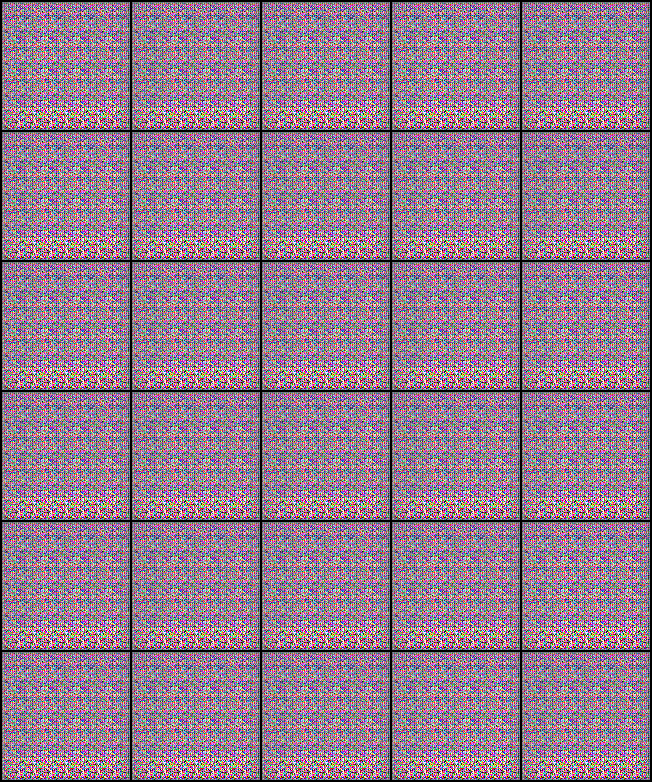

In [ ]:
Image('./generated/generated-images-0001.png')

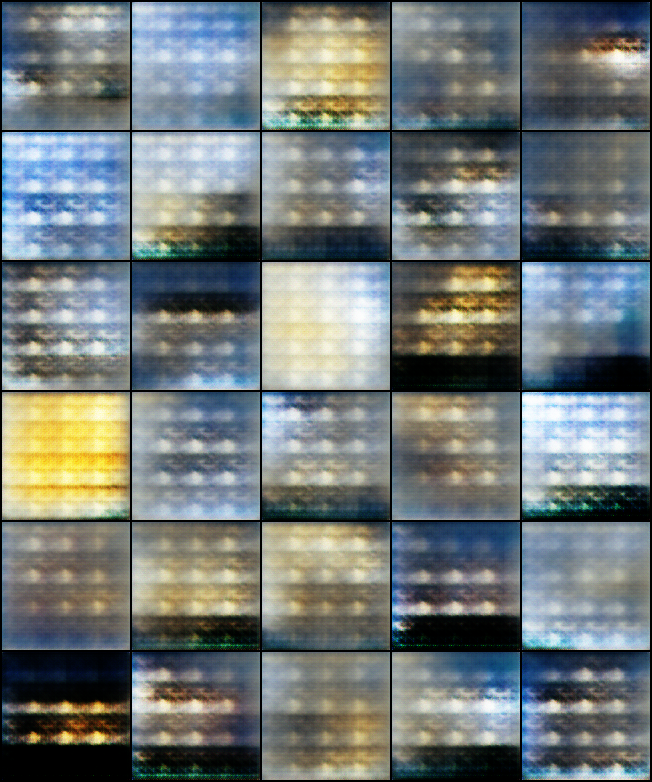

In [ ]:
Image('./generated/generated-images-0025.png')

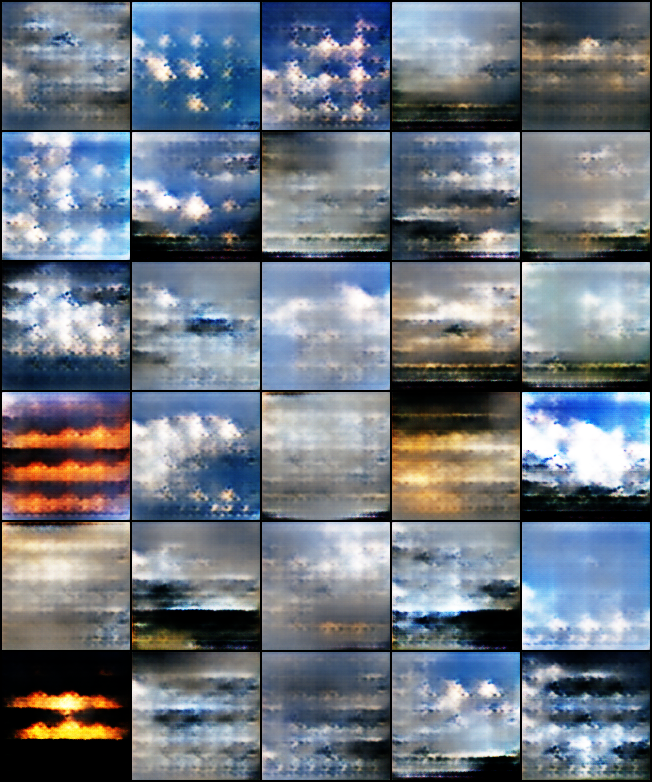

In [ ]:
Image('./generated/generated-images-0050.png')

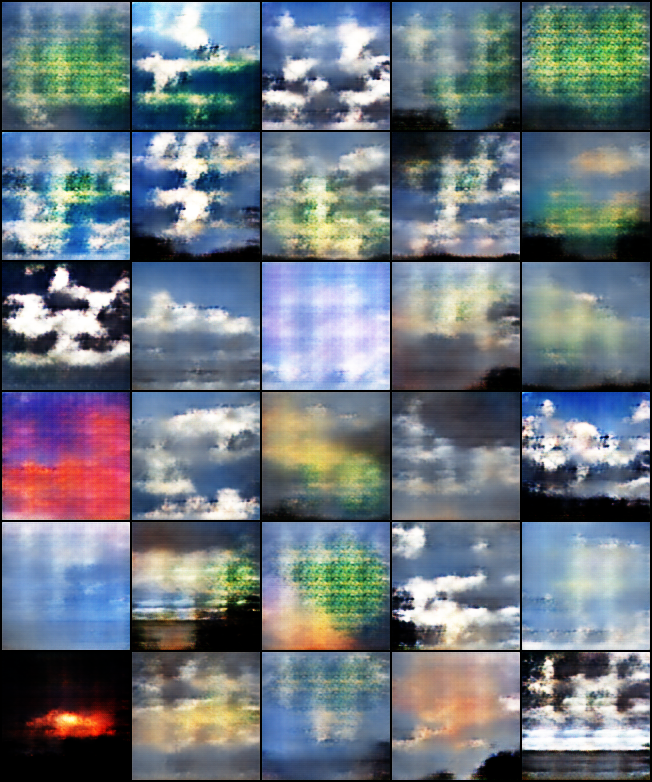

In [ ]:
Image('./generated/generated-images-0100.png')

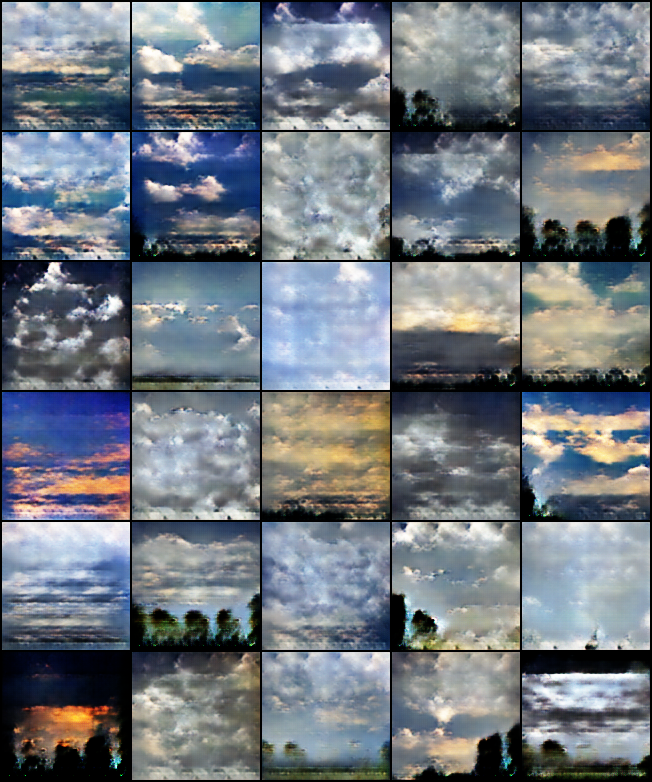

In [ ]:
Image('./generated/generated-images-0150.png')

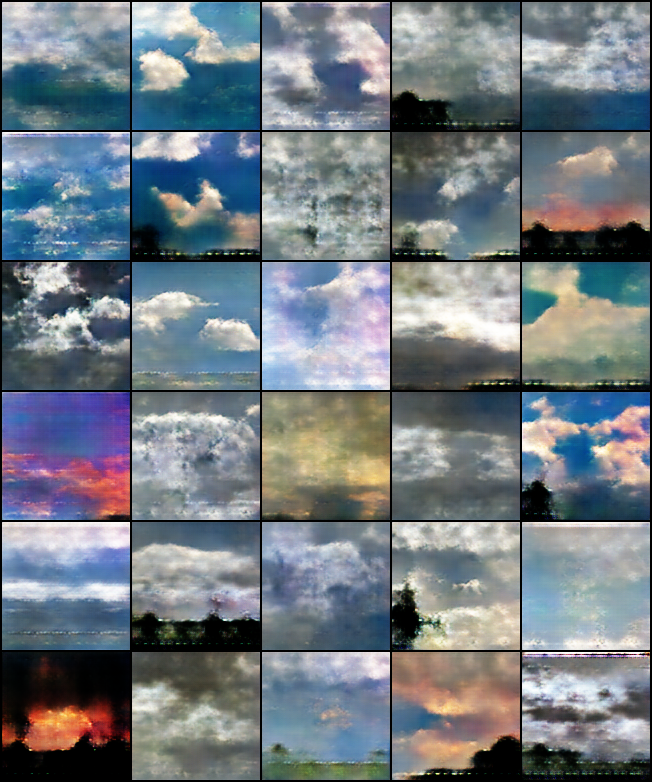

In [ ]:
Image('./generated/generated-images-0160.png')

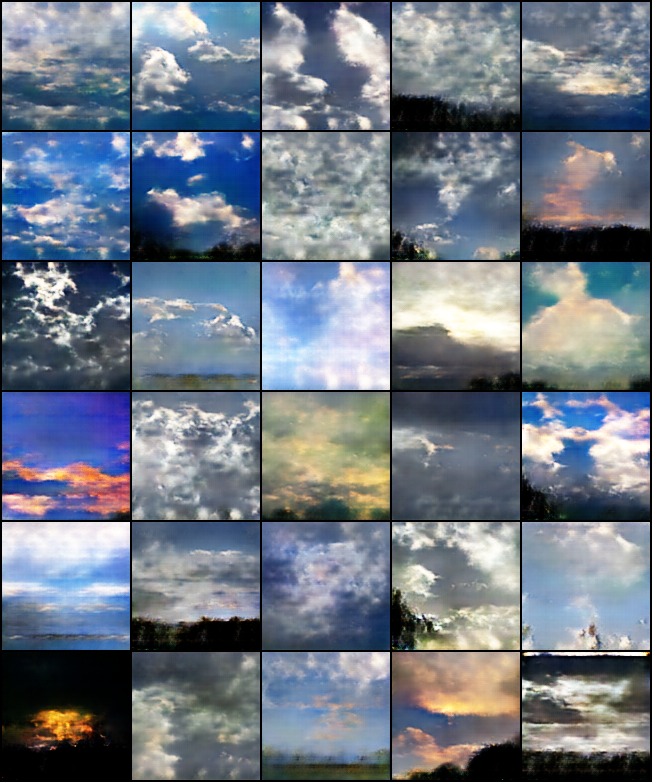

In [ ]:
Image('./generated/generated-images-0170.png')

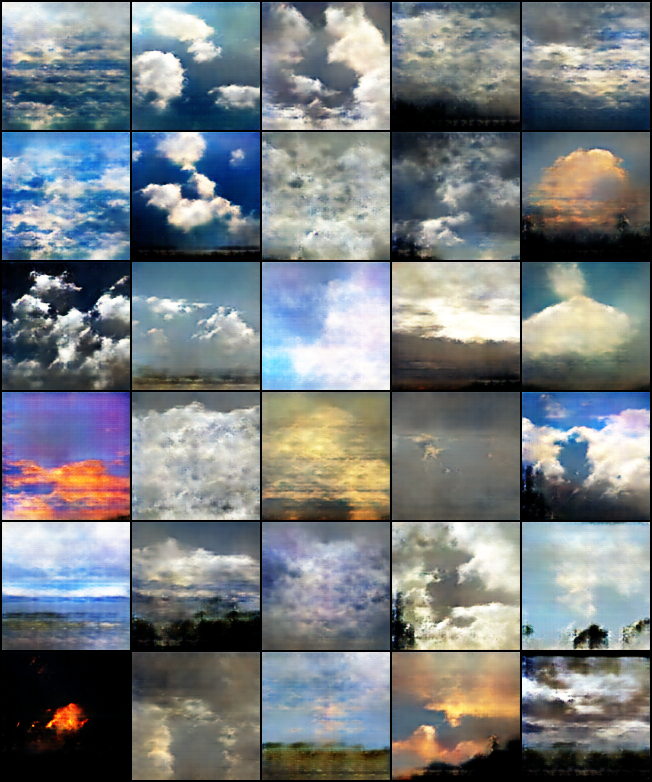

In [ ]:
Image('./generated/generated-images-0180.png')

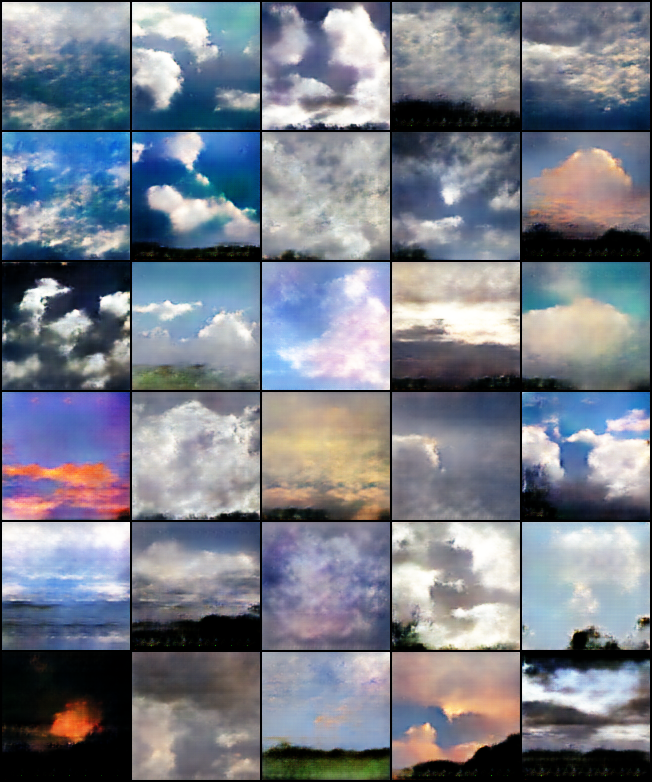

In [ ]:
Image('./generated/generated-images-0185.png')

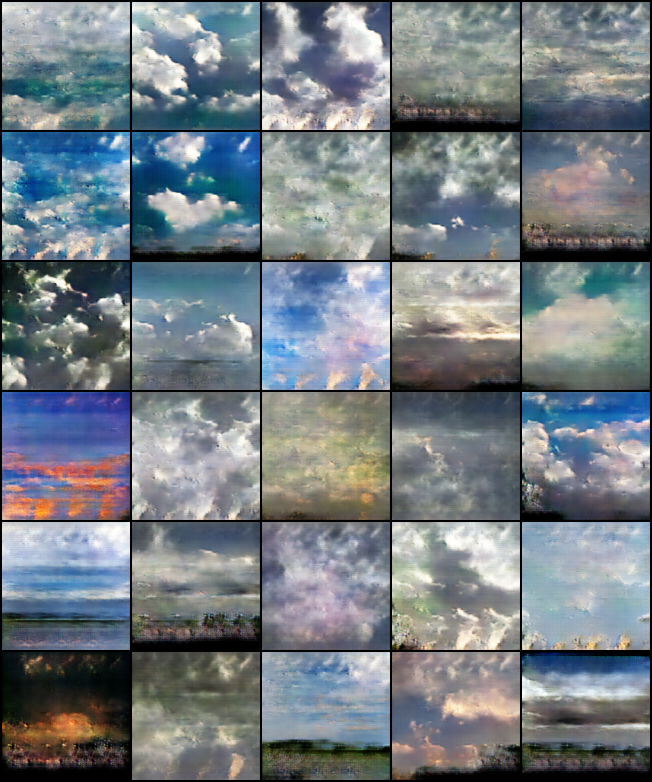

In [ ]:
Image('./generated/generated-images-0190.png')

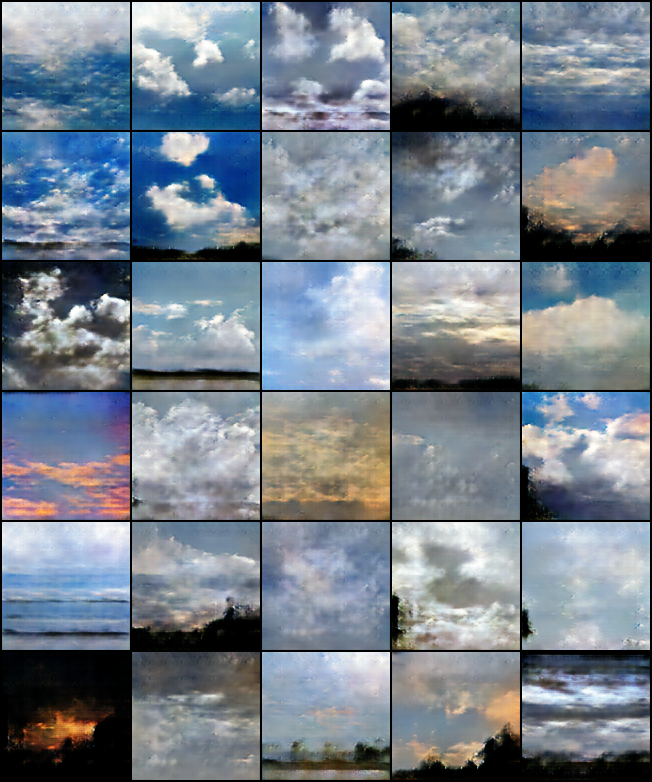

In [ ]:
Image('./generated/generated-images-0200.png')